**Description:**

This is the Jupyter notebook for the decision tree as part of our EDA analysis.

**Project Name:** Lending Club

**Team:** Silas Mederer, Jonas Bechthold

**Date:** 2020-10-02 to 2020-10-08

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import datetime
from scipy import stats
%matplotlib inline

import graphviz
import warnings
warnings.filterwarnings("ignore")

df = pd.read_csv("data/df_clean.csv")
df.drop("Unnamed: 0", inplace=True, axis=1)
df.head()

,loan_amnt,term_is_36,int_rate,grade,sub_grade,emp_length,annual_inc,purpose,addr_state,dti,inq_last_6mths,open_acc,pub_rec,total_acc,pub_rec_bankruptcies,default
0,5000.0,1,0.1065,B,B2,10,24000.0,credit_card,AZ,27.65,1.0,3.0,0.0,9.0,0,0
1,2500.0,0,0.1527,C,C4,0,30000.0,car,GA,1.00,5.0,3.0,0.0,4.0,0,1
2,2400.0,1,0.1596,C,C5,10,12252.0,small_business,IL,8.72,2.0,2.0,0.0,10.0,0,0
3,10000.0,1,0.1349,C,C1,10,49200.0,other,CA,20.00,1.0,10.0,0.0,37.0,0,0
4,5000.0,1,0.0790,A,A4,3,36000.0,wedding,AZ,11.20,3.0,9.0,0.0,12.0,0,0


# Desicion tree as part of EDA

In [2]:
df.select_dtypes('object').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41292 entries, 0 to 41291
Data columns (total 4 columns):
grade         41292 non-null object
sub_grade     41292 non-null object
purpose       41292 non-null object
addr_state    41292 non-null object
dtypes: object(4)
memory usage: 1.3+ MB


## get dummies for categorials

In [4]:
categorial_var = list(df.select_dtypes('object').columns)
categorial_var

['grade', 'sub_grade', 'purpose', 'addr_state']

In [5]:
columns = df.columns
X = pd.get_dummies(df[columns[:-1]], drop_first=True)
X.head()
columns = X.columns

In [6]:
y = df["default"].values
y[1:5]

array([1, 0, 0, 0])

In [59]:
columnlist = df.columns[:-1]
X1 = df[columnlist]
X1

,loan_amnt,term_is_36,int_rate,grade,sub_grade,emp_length,annual_inc,purpose,addr_state,dti,inq_last_6mths,open_acc,pub_rec,total_acc,pub_rec_bankruptcies
0,5000.0,1,0.1065,B,B2,10,24000.00,credit_card,AZ,27.65,1.0,3.0,0.0,9.0,0
1,2500.0,0,0.1527,C,C4,0,30000.00,car,GA,1.00,5.0,3.0,0.0,4.0,0
2,2400.0,1,0.1596,C,C5,10,12252.00,small_business,IL,8.72,2.0,2.0,0.0,10.0,0
3,10000.0,1,0.1349,C,C1,10,49200.00,other,CA,20.00,1.0,10.0,0.0,37.0,0
4,5000.0,1,0.0790,A,A4,3,36000.00,wedding,AZ,11.20,3.0,9.0,0.0,12.0,0
5,7000.0,0,0.1596,C,C5,8,47004.00,debt_consolidation,NC,23.51,1.0,7.0,0.0,11.0,0
6,3000.0,1,0.1864,E,E1,9,48000.00,car,CA,5.35,2.0,4.0,0.0,4.0,0
7,5600.0,0,0.2128,F,F2,4,40000.00,small_business,CA,5.55,2.0,11.0,0.0,13.0,0
8,5375.0,0,0.1269,B,B5,0,15000.00,other,TX,18.08,0.0,2.0,0.0,3.0,0
9,6500.0,0,0.1465,C,C3,5,72000.00,debt_consolidation,AZ,16.12,2.0,14.0,0.0,23.0,0


## Build the model

In [12]:
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score
from sklearn import tree

In [61]:
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X, y)
y_pred = clf.predict(X)

print(f"Confusion Matrix:")
print(confusion_matrix(y,y_pred))
print(f"Precission Score: {precision_score(y,y_pred)}")
print(f"Accuracy Score:   {accuracy_score(y,y_pred)}")

Confusion Matrix:
[[35006     0]
 [    1  6285]]
Precission Score: 1.0
Accuracy Score:   0.9999757822338468


## Plot tree

In [62]:
#tree.plot_tree(clf,filled=True);

In [63]:
import graphviz
# DOT data
dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=X.columns,  
                                filled=True,rounded=True,  
                                special_characters=True)
# Draw graph
graph = graphviz.Source(dot_data, format="pdf") 
graph.render("tree", "plots/") 
graph

## Overview of the feature importance for the decision tree

In [64]:
importance = clf.feature_importances_
importance = pd.DataFrame(importance, index=X.columns, columns=["Importance"])
importance = importance.sort_values(['Importance'], ascending=False)
importance

,Importance
dti,0.125225
int_rate,0.112857
annual_inc,0.108408
loan_amnt,0.094831
total_acc,0.083445
open_acc,0.069202
emp_length,0.051285
inq_last_6mths,0.037549
addr_state_CA,0.014991
term_is_36,0.010581


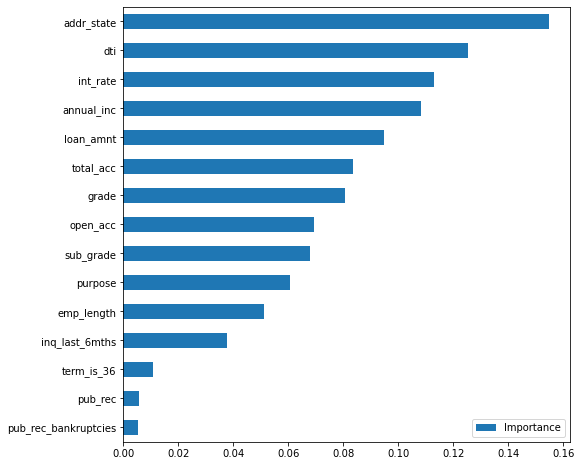

In [65]:
# joined importances of our dummy variables
importance_join = pd.DataFrame(index = X1.columns)
for i1 in X1.select_dtypes('object').columns:
    #print(i1)
    t_sum = 0
    for i2 in importance.index:
        if i1 in i2:
            #print ('--' + i2)
            t_sum += importance.loc[i2,'Importance']
    
    importance_join.loc[i1,'Importance'] = t_sum
            
for i in X1.select_dtypes(np.number).columns:
    importance_join.loc[i,'Importance'] = importance.loc[i,'Importance']
    
importance_join = importance_join.sort_values(['Importance'], ascending=True)
importance_join.plot(kind='barh', figsize=(8,8))

plt.savefig('plots/dectree_feature_importance', tight_layout=True)